In [3]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import numpy as np
import os 
import cv2
import sys
from sklearn.model_selection import train_test_split

In [4]:
datadir = '../data/actors/faces'
categories = ['Aaron_Eckhart','Adam_Brody','Adam_McKay']

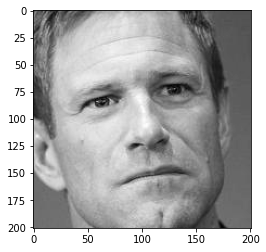

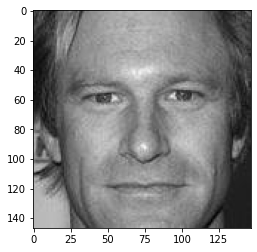

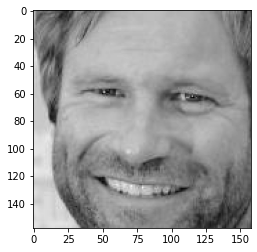

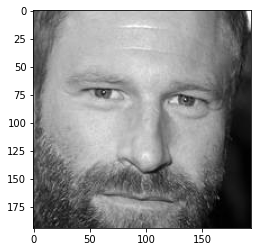

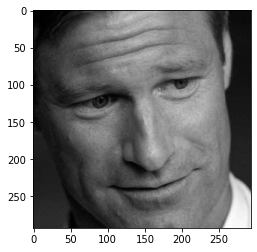

...

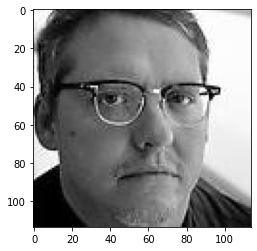

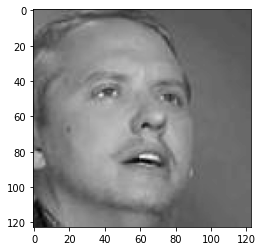

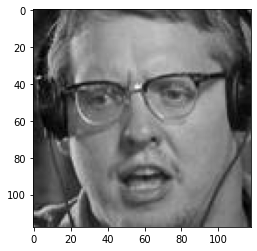

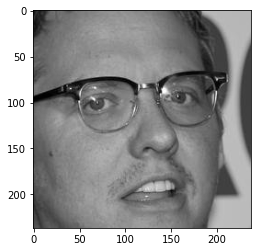

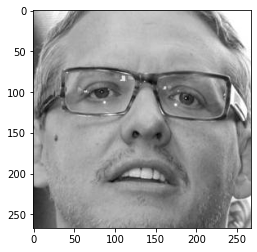

In [5]:
for category in categories:
    path = os.path.join(datadir,category)
    for img in os.listdir(path):
        img_array = cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
        plt.imshow(img_array,cmap="gray")
        plt.show()

'dam_McKay_753_452.jpeg'

In [20]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
        '../data/actors/images',
        target_size=(150, 150),
        color_mode='grayscale',
        batch_size=32,
        class_mode='categorical')
validation_generator = test_datagen.flow_from_directory(
        '../data/actors/images',
        target_size=(150, 150),
        color_mode='grayscale',
        batch_size=32,
        class_mode='categorical')

Found 38860 images belonging to 530 classes.
Found 38860 images belonging to 530 classes.


In [21]:
model = tf.keras.models.Sequential([
    keras.layers.Conv2D(64, 7, activation="relu", padding="same",input_shape=[150,150,1]),#input shape: [rows, columns, channels]
    keras.layers.MaxPooling2D(2),
    keras.layers.Conv2D(128, 3, activation="relu", padding="same"),
    keras.layers.Conv2D(128, 3, activation="relu", padding="same"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Conv2D(256, 3, activation="relu", padding="same"),
    keras.layers.Conv2D(256, 3, activation="relu", padding="same"),
    keras.layers.MaxPooling2D(2),
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10, activation="softmax")
])

model.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

In [22]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 150, 150, 64)      3200      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 75, 75, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 75, 75, 128)       73856     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 75, 75, 128)       147584    
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 37, 37, 128)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 37, 37, 256)       295168    
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 37, 37, 256)      

In [23]:
mc = tf.keras.callbacks.ModelCheckpoint('seqkeras.h5', 
                     save_best_only=True,
                     save_weights_only=False, #transfer learn
                     save_freq='epoch')
es = EarlyStopping(monitor='val_accuracy', 
                   mode='auto', 
                   verbose=1, 
                   patience=15, #if no changes within 15 epochs,stop
                   restore_best_weights=True)
history = model.fit(train_generator,
                    epochs=500,
                    validation_data = validation_generator, 
                    callbacks = [es,mc])
score = model.evaluate(validation_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])  # this is the one we care about

Epoch 1/500


InvalidArgumentError:  logits and labels must be broadcastable: logits_size=[32,10] labels_size=[32,530]
	 [[node categorical_crossentropy/softmax_cross_entropy_with_logits (defined at var/folders/nt/rg8_jkq90v77r8l8dc_9wl0m0000gn/T/ipykernel_47418/2269995993.py:10) ]] [Op:__inference_train_function_2532]

Function call stack:
train_function
